Sentiment Analysis 
- VADER (Valence Aware Dictionary and Sentiment Reasoner) - Bag of Words
- Roberta pretrained Model 
- Huggingface pipeline

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ARCHITA\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [2]:
#plt.style.use('ggplot')

In [3]:
reddit_df = pd.read_csv("reddit_data.csv")
twt_df = pd.read_csv("twitter_data.csv")

In [4]:
reddit_df = (reddit_df.head(500))
reddit_df 
#print(reddit_df.shape)

,clean_comment,category
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1
...,...,...
495,you wondering whether girl will get through t...,1
496,will end all you chie doesn make through,0
497,chie inami shion petra dekomori kumin yui all ...,-1
498,make sure you vote for inami she adorable when...,1


In [5]:
reddit_df.head()

,clean_comment,category
0,family mormon have never tried explain them t...,1
1,buddhism has very much lot compatible with chr...,1
2,seriously don say thing first all they won get...,-1
3,what you have learned yours and only yours wha...,0
4,for your own benefit you may want read living ...,1


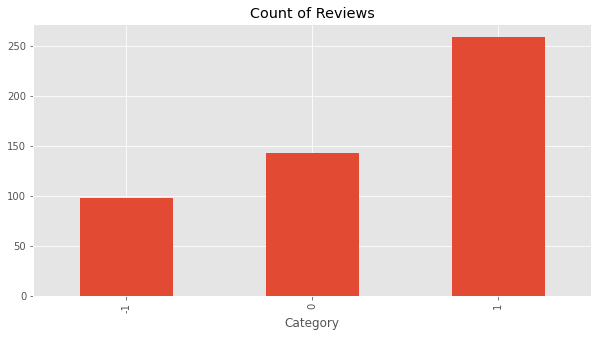

In [6]:
ax = reddit_df['category'].value_counts().sort_index().plot(kind='bar',
                                                      title='Count of Reviews',
                                                      figsize=(10,5))
#category > scores vid
ax.set_xlabel('Category') 
#category > review stars
plt.show()

higher level of 1's depict positive reviews

In [7]:
# Basic nltk
ex = reddit_df['clean_comment'][50]
print(ex)

are you guys seriously pissed about idli sambar remark thought were past all this second thoughts one gives shit about the tea party not even the their craziness got too much even for the hardcore republicans 


In [8]:
tokens = nltk.word_tokenize(ex)
tokens[:10]

['are',
 'you',
 'guys',
 'seriously',
 'pissed',
 'about',
 'idli',
 'sambar',
 'remark',
 'thought']

In [9]:
#declares parts of speech POS
nltk.download('averaged_perceptron_tagger')
tagged = nltk.pos_tag(tokens) 
tagged[:10]

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\ARCHITA\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


[('are', 'VBP'),
 ('you', 'PRP'),
 ('guys', 'VBP'),
 ('seriously', 'RB'),
 ('pissed', 'VBN'),
 ('about', 'IN'),
 ('idli', 'JJ'),
 ('sambar', 'NN'),
 ('remark', 'NN'),
 ('thought', 'NN')]

In [10]:
#groups the tokens into chunks of text
nltk.download('words')
nltk.download('maxent_ne_chunker')
entities = nltk.chunk.ne_chunk(tagged[:10])
entities.pprint()

(S
  are/VBP
  you/PRP
  guys/VBP
  seriously/RB
  pissed/VBN
  about/IN
  idli/JJ
  sambar/NN
  remark/NN
  thought/NN)


[nltk_data] Downloading package words to
[nltk_data]     C:\Users\ARCHITA\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     C:\Users\ARCHITA\AppData\Roaming\nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!


#VADER SENTIMENT SCORING (valence aware dictionary sentiment reasoner)
nltk's Sentiment Intensity analyzer to get neg/neu/pos scores of the text
>>uses bag of words approach

In [11]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
nltk.download('vader_lexicon')

sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\ARCHITA\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [12]:
sia.polarity_scores('I am feeling a lot bettter')

{'neg': 0.0, 'neu': 0.667, 'pos': 0.333, 'compound': 0.128}

In [13]:
sia.polarity_scores("this day just keeps getting worst")

{'neg': 0.451, 'neu': 0.549, 'pos': 0.0, 'compound': -0.6249}

In [14]:
sia.polarity_scores(ex)

{'neg': 0.264, 'neu': 0.677, 'pos': 0.059, 'compound': -0.8555}

In [15]:
reddit_df['Id'] = reddit_df.reset_index().index + 1


In [16]:
list(reddit_df.columns)

['clean_comment', 'category', 'Id']

In [17]:
reddit_df['clean_comment'] = reddit_df['clean_comment'].astype(str)

In [18]:
#runs the polarity score over the complete dataset
dic = {}
for i, row in tqdm(reddit_df.iterrows(), total=len(reddit_df)):
    text = row['clean_comment']
    myid = row['Id']
    dic[myid] = sia.polarity_scores(text)

  0%|          | 0/500 [00:00<?, ?it/s]

In [19]:
pd.DataFrame(dic).T
#stores the polarity scores in a pandas dataframe

,neg,neu,pos,compound
1,0.067,0.594,0.339,0.9349
2,0.066,0.653,0.280,0.9953
3,0.035,0.825,0.140,0.8750
4,0.000,0.956,0.044,0.0772
5,0.102,0.704,0.194,0.8907
...,...,...,...,...
496,0.000,0.908,0.092,0.5927
497,0.000,1.000,0.000,0.0000
498,0.000,1.000,0.000,0.0000
499,0.167,0.467,0.367,0.4588


In [20]:
vaders = pd.DataFrame(dic).T
vaders = vaders.reset_index().rename(columns={'index': 'Id'})
vaders = vaders.merge(reddit_df, how='left')
#T flips horizontally
#merges the polarity scores with the original dataset

In [21]:
vaders

,Id,neg,neu,pos,compound,clean_comment,category
0,1,0.067,0.594,0.339,0.9349,family mormon have never tried explain them t...,1
1,2,0.066,0.653,0.280,0.9953,buddhism has very much lot compatible with chr...,1
2,3,0.035,0.825,0.140,0.8750,seriously don say thing first all they won get...,-1
3,4,0.000,0.956,0.044,0.0772,what you have learned yours and only yours wha...,0
4,5,0.102,0.704,0.194,0.8907,for your own benefit you may want read living ...,1
...,...,...,...,...,...,...,...
495,496,0.000,0.908,0.092,0.5927,you wondering whether girl will get through t...,1
496,497,0.000,1.000,0.000,0.0000,will end all you chie doesn make through,0
497,498,0.000,1.000,0.000,0.0000,chie inami shion petra dekomori kumin yui all ...,-1
498,499,0.167,0.467,0.367,0.4588,make sure you vote for inami she adorable when...,1


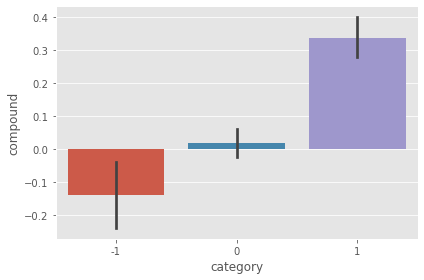

In [22]:
sns.barplot(data = vaders, x='category', y='compound')
ax.set_title('Compound Score by Reddit Star Reviews', loc='center')
plt.tight_layout()
plt.show()

the reviews gets less negative as the rating goes higher

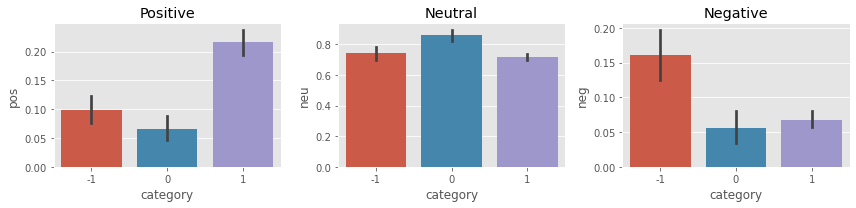

In [23]:
fig, axs = plt.subplots(1,3, figsize=(12,3)) 
#makes 1:3 grid of results
sns.barplot(data = vaders, x='category', y='pos', ax= axs[0])
sns.barplot(data = vaders, x='category', y='neu', ax= axs[1])
sns.barplot(data = vaders, x='category', y='neg', ax= axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

postive have higher +ve barplot and neutral have all the three in kind of neutral state same in the negative bar plot

Roberta pretrained Model
>>used in order to pick up on the sarcast statement in a  comment.
using a model trained for a large corpus of data,
Transformer model accounts for the words but also the context related to others

In [24]:
#!pip install torch 
#!pip install tensorflow

In [25]:
!pip install transformers
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

In [26]:
import os
os.environ["HF_HUB_DISABLE_SYMLINKS_WARNING"] = "1"


In [27]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
##from huggingface
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

#VADER RESULTS 

In [28]:
print(ex)
sia.polarity_scores(ex)

are you guys seriously pissed about idli sambar remark thought were past all this second thoughts one gives shit about the tea party not even the their craziness got too much even for the hardcore republicans 


{'neg': 0.264, 'neu': 0.677, 'pos': 0.059, 'compound': -0.8555}

In [29]:
#ROBERTA Model
encoded_text = tokenizer(ex, return_tensors='pt')
output = model(**encoded_text)
scores = output[0][0].detach().numpy()
scores = softmax(scores)
scores_dict = {
    'roberta_neg': scores[0],
    'roberta_neu': scores[1],
    'roberta_pos': scores[2]
}
print(scores_dict)

{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}


In [40]:
#ROBERTA Model
def polarity_scores_roberta(example):
    encoded_text = tokenizer(ex, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
        'roberta_neg': scores[0],
        'roberta_neu': scores[1],
        'roberta_pos': scores[2]
    }
    return scores_dict

In [31]:
dic = {}
for i, row in tqdm(reddit_df.iterrows(), total=len(reddit_df)):
    try:
        text = row['clean_comment']
        myid = row['Id']
        vader_result = sia.polarity_scores(text)
        roberta_result = polarity_scores_roberta(text)

        if vader_result is not None and roberta_result is not None:
            both = {f"vader_{key}": value for key, value in vader_result.items()}
            both.update(roberta_result)
            dic[myid] = both
        else:
            # Handle the case when either result is None
            pass

    except RuntimeError:
        print(f'Broke for id {myid}')
        # Add appropriate code here based on your requirements


  0%|          | 0/500 [00:00<?, ?it/s]

{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 0.8932921, 'roberta_neu': 0.09823274, 'roberta_pos': 0.008475251}
{'roberta_neg': 

In [51]:
dic = {}
for i, row in tqdm(reddit_df.iterrows(), total=len(reddit_df)):
    text = row['clean_comment']
    myid = row["Id"]
    vader_result = sia.polarity_scores(text)
    vader_result_rename = {}
    for key, value in vader_result.items():
        vader_result_rename[f"vader_{key}"] = value
    roberta_result = polarity_scores_roberta(text)
    both = {**vader_result_rename, **roberta_result}
    dic[myid] = both
    

  0%|          | 0/500 [00:00<?, ?it/s]

In [50]:
both

{'vader_neg': 0.067,
 'vader_neu': 0.594,
 'vader_pos': 0.339,
 'vader_compound': 0.9349,
 'roberta_neg': 0.8932921,
 'roberta_neu': 0.09823274,
 'roberta_pos': 0.008475251}

{'roberta_neg': 0.8932921,
 'roberta_neu': 0.09823274,
 'roberta_pos': 0.008475251}

In [52]:
output = ""
for myid, result in dic.items():
    output += f"ID: {myid}\n"
    for key, value in result.items():
        output += f"{key}: {value}\n"
    output += "\n"  # Add a blank line between entries

print(output)


ID: 1
vader_neg: 0.067
vader_neu: 0.594
vader_pos: 0.339
vader_compound: 0.9349
roberta_neg: 0.8932921290397644
roberta_neu: 0.09823273867368698
roberta_pos: 0.00847525056451559

ID: 2
vader_neg: 0.066
vader_neu: 0.653
vader_pos: 0.28
vader_compound: 0.9953
roberta_neg: 0.8932921290397644
roberta_neu: 0.09823273867368698
roberta_pos: 0.00847525056451559

ID: 3
vader_neg: 0.035
vader_neu: 0.825
vader_pos: 0.14
vader_compound: 0.875
roberta_neg: 0.8932921290397644
roberta_neu: 0.09823273867368698
roberta_pos: 0.00847525056451559

ID: 4
vader_neg: 0.0
vader_neu: 0.956
vader_pos: 0.044
vader_compound: 0.0772
roberta_neg: 0.8932921290397644
roberta_neu: 0.09823273867368698
roberta_pos: 0.00847525056451559

ID: 5
vader_neg: 0.102
vader_neu: 0.704
vader_pos: 0.194
vader_compound: 0.8907
roberta_neg: 0.8932921290397644
roberta_neu: 0.09823273867368698
roberta_pos: 0.00847525056451559

ID: 6
vader_neg: 0.0
vader_neu: 0.898
vader_pos: 0.102
vader_compound: 0.3626
roberta_neg: 0.8932921290397644


In [53]:
results_df = pd.DataFrame(dic).T
results_df = results_df.reset_index().rename(columns={'index': 'Id'})
results_df = results_df.merge(reddit_df, how='left')
#T flips horizontally

In [54]:
results_df.head()

,Id,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos,clean_comment,category
0,1,0.067,0.594,0.339,0.9349,0.893292,0.098233,0.008475,family mormon have never tried explain them t...,1
1,2,0.066,0.653,0.280,0.9953,0.893292,0.098233,0.008475,buddhism has very much lot compatible with chr...,1
2,3,0.035,0.825,0.140,0.8750,0.893292,0.098233,0.008475,seriously don say thing first all they won get...,-1
3,4,0.000,0.956,0.044,0.0772,0.893292,0.098233,0.008475,what you have learned yours and only yours wha...,0
4,5,0.102,0.704,0.194,0.8907,0.893292,0.098233,0.008475,for your own benefit you may want read living ...,1


#Compare Scores between models

In [57]:
results_df.columns

Index(['Id', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound',
       'roberta_neg', 'roberta_neu', 'roberta_pos', 'clean_comment',
       'category'],
      dtype='object')

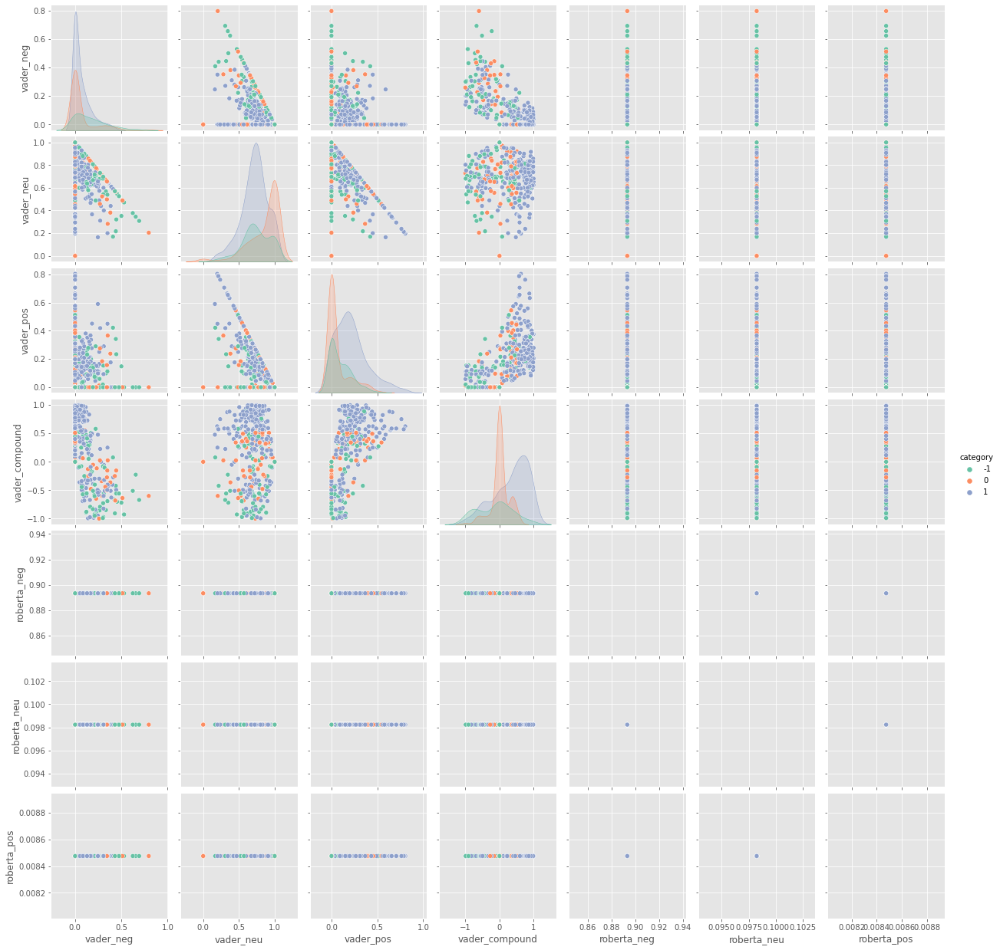

In [67]:
sns.pairplot(data = results_df,
            vars = ['vader_neg', 'vader_neu', 'vader_pos', 'vader_compound',
       'roberta_neg', 'roberta_neu', 'roberta_pos'],
             hue = 'category', palette = 'Set2')
            
plt.show()

##Review Examples
negative sentiment 1star review

In [74]:
print(results_df.columns)


Index(['Id', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound',
       'roberta_neg', 'roberta_neu', 'roberta_pos', 'clean_comment',
       'category'],
      dtype='object')


In [75]:
results_df.query('category == 1').sort_values('roberta_pos', ascending = False)['clean_comment'].values[0]

' family mormon have never tried explain them they still stare puzzled from time time like some kind strange creature nonetheless they have come admire for the patience calmness equanimity acceptance and compassion have developed all the things buddhism teaches '

In [76]:
results_df.query('category == 1').sort_values('vader_pos', ascending = False)['clean_comment'].values[0]

'great goal '

##negative sentiment 5star review

In [78]:
results_df.query('category == -1').sort_values('roberta_neg', ascending = False)['clean_comment'].values[0]

'seriously don say thing first all they won get its too complex explain normal people anyway and they are dogmatic then doesn matter what you say see mechante post and for any reason you decide later life move from buddhism and that doesn suit you identity though you still get keep all the wisdom then your family will treat you like you went through weird hippy phase for while there didncha and you never hear the end pro tip don put one these your wall jpg '

In [79]:
results_df.query('category == -1').sort_values('vader_neg', ascending = False)['clean_comment'].values[0]

'venkayya naidu killed '

Transformers Pipeline ##hugging face 

In [82]:
from transformers import pipeline
sent_pipeline = pipeline("sentiment-analysis")

No model was supplied, defaulted to distilbert-base-uncased-finetuned-sst-2-english and revision af0f99b (https://huggingface.co/distilbert-base-uncased-finetuned-sst-2-english).
Using a pipeline without specifying a model name and revision in production is not recommended.


C:\Users\ARCHITA\anaconda3\lib\site-packages\huggingface_hub\file_download.py:133: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\ARCHITA\.cache\huggingface\hub. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


In [83]:
sent_pipeline('I want to go hibernate!')

[{'label': 'POSITIVE', 'score': 0.9994550347328186}]

In [84]:
sent_pipeline('I dont want to go !')

[{'label': 'NEGATIVE', 'score': 0.9889677166938782}]

In [85]:
sent_pipeline('I hate disgusting and smelly people')

[{'label': 'NEGATIVE', 'score': 0.9982656836509705}]

TWITTER REVIEWS ANALYSIS

In [86]:
twt_df

,clean_text,category
0,when modi promised “minimum government maximum...,-1.0
1,talk all the nonsense and continue all the dra...,0.0
2,what did just say vote for modi welcome bjp t...,1.0
3,asking his supporters prefix chowkidar their n...,1.0
4,answer who among these the most powerful world...,1.0
...,...,...
162975,why these 456 crores paid neerav modi not reco...,-1.0
162976,dear rss terrorist payal gawar what about modi...,-1.0
162977,did you cover her interaction forum where she ...,0.0
162978,there big project came into india modi dream p...,0.0


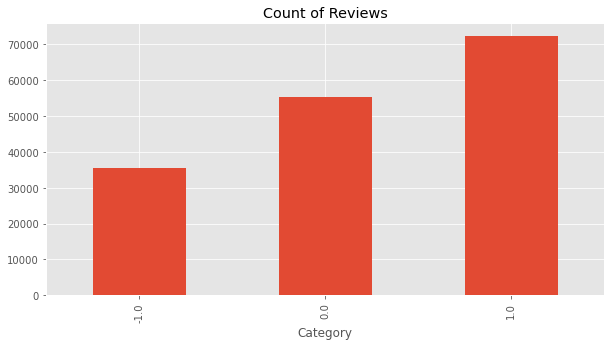

In [98]:
a = twt_df['category'].value_counts().sort_index().plot(kind='bar',
                                                      title='Count of Reviews',
                                                      figsize=(10,5))

a.set_xlabel('Category') 
plt.show()

In [99]:
# Basic nltk
eg = twt_df['clean_text'][50]
print(eg)

overpromise and underdelivery – that pithy summary the economic outcome the last five years under approach the general election ौीाोै



In [100]:
tokens = nltk.word_tokenize(ex)
tokens[:10]

['overpromise',
 'and',
 'underdelivery',
 '–',
 'that',
 'pithy',
 'summary',
 'the',
 'economic',
 'outcome']

In [101]:
#declares parts of speech POS
tagged = nltk.pos_tag(tokens) 
tagged[:10]

[('overpromise', 'NN'),
 ('and', 'CC'),
 ('underdelivery', 'JJ'),
 ('–', 'NN'),
 ('that', 'WDT'),
 ('pithy', 'VBZ'),
 ('summary', 'PDT'),
 ('the', 'DT'),
 ('economic', 'JJ'),
 ('outcome', 'NN')]

In [102]:
#groups the tokens into chunks of text
entities = nltk.chunk.ne_chunk(tagged[:10])
entities.pprint()

(S
  overpromise/NN
  and/CC
  underdelivery/JJ
  –/NN
  that/WDT
  pithy/VBZ
  summary/PDT
  the/DT
  economic/JJ
  outcome/NN)


VADER SENTIMENT SCORING

In [103]:
sia.polarity_scores(eg)

{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

In [105]:
twt_df['Id'] = twt_df.reset_index().index + 1

In [106]:
list(twt_df.columns)

['clean_text', 'category', 'Id']

In [107]:
twt_df['clean_text'] = twt_df['clean_text'].astype(str)

In [108]:
#runs the polarity score over the complete dataset
dic = {}
for i, row in tqdm(twt_df.iterrows(), total=len(twt_df)):
    text = row['clean_text']
    myid = row['Id']
    dic[myid] = sia.polarity_scores(text)

  0%|          | 0/162980 [00:00<?, ?it/s]

In [109]:
pd.DataFrame(dic).T
#stores the polarity scores in a pandas dataframe

,neg,neu,pos,compound
1,0.065,0.781,0.154,0.5267
2,0.184,0.816,0.000,-0.4019
3,0.000,0.772,0.228,0.7096
4,0.187,0.655,0.158,-0.0713
5,0.000,0.808,0.192,0.4754
...,...,...,...,...
162976,0.081,0.919,0.000,-0.1280
162977,0.398,0.491,0.111,-0.9571
162978,0.000,1.000,0.000,0.0000
162979,0.000,0.889,0.111,0.1280


In [110]:
vaders = pd.DataFrame(dic).T
vaders = vaders.reset_index().rename(columns={'index': 'Id'})
vaders = vaders.merge(twt_df, how='left')
#T flips horizontally
#merges the polarity scores with the original dataset

In [111]:
vaders

,Id,neg,neu,pos,compound,clean_text,category
0,1,0.065,0.781,0.154,0.5267,when modi promised “minimum government maximum...,-1.0
1,2,0.184,0.816,0.000,-0.4019,talk all the nonsense and continue all the dra...,0.0
2,3,0.000,0.772,0.228,0.7096,what did just say vote for modi welcome bjp t...,1.0
3,4,0.187,0.655,0.158,-0.0713,asking his supporters prefix chowkidar their n...,1.0
4,5,0.000,0.808,0.192,0.4754,answer who among these the most powerful world...,1.0
...,...,...,...,...,...,...,...
162975,162976,0.081,0.919,0.000,-0.1280,why these 456 crores paid neerav modi not reco...,-1.0
162976,162977,0.398,0.491,0.111,-0.9571,dear rss terrorist payal gawar what about modi...,-1.0
162977,162978,0.000,1.000,0.000,0.0000,did you cover her interaction forum where she ...,0.0
162978,162979,0.000,0.889,0.111,0.1280,there big project came into india modi dream p...,0.0


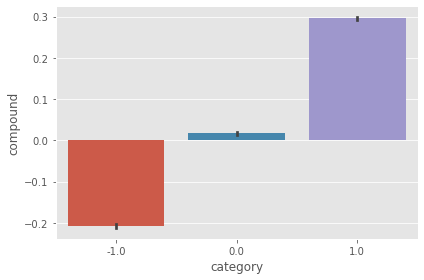

In [112]:
sns.barplot(data = vaders, x='category', y='compound')
a.set_title('Compound Score by Twitter Star Reviews', loc='center')
plt.tight_layout()
plt.show()

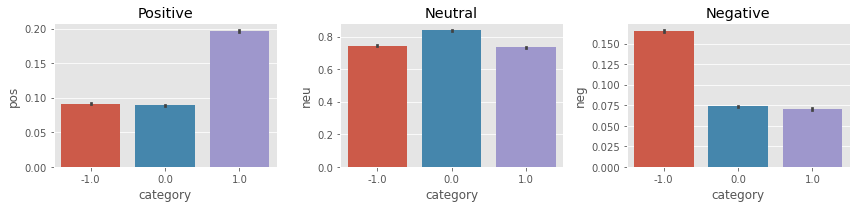

In [114]:
fig, axs = plt.subplots(1,3, figsize=(12,3)) 
#makes 1:3 grid of results
sns.barplot(data = vaders, x='category', y='pos', ax= axs[0])
sns.barplot(data = vaders, x='category', y='neu', ax= axs[1])
sns.barplot(data = vaders, x='category', y='neg', ax= axs[2])
axs[0].set_title('Positive')
axs[1].set_title('Neutral')
axs[2].set_title('Negative')
plt.tight_layout()
plt.show()

In [115]:
print(eg)
sia.polarity_scores(eg)

overpromise and underdelivery – that pithy summary the economic outcome the last five years under approach the general election ौीाोै



{'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}

ROBERTA PRETRAINED MODEL

In [116]:
#ROBERTA Model
encoded_text = tokenizer(eg, return_tensors='pt')
output = model(**encoded_text)
scores = output[0][0].detach().numpy()
scores = softmax(scores)
scores_dict = {
    'roberta_neg': scores[0],
    'roberta_neu': scores[1],
    'roberta_pos': scores[2]
}
print(scores_dict)

{'roberta_neg': 0.30976775, 'roberta_neu': 0.64855856, 'roberta_pos': 0.04167368}


In [117]:
def polarity_scores_roberta(example):
    encoded_text = tokenizer(eg, return_tensors='pt')
    output = model(**encoded_text)
    scores = output[0][0].detach().numpy()
    scores = softmax(scores)
    scores_dict = {
        'roberta_neg': scores[0],
        'roberta_neu': scores[1],
        'roberta_pos': scores[2]
    }
    return scores_dict

In [119]:
dic = {}
for i, row in tqdm(twt_df.iterrows(), total=len(twt_df)):
    try:
        text = row['clean_text']
        myid = row['Id']
        vader_res = sia.polarity_scores(text)
        roberta_res = polarity_scores_roberta(text)

        if vader_res is not None and roberta_res is not None:
            both = {f"vader_{key}": value for key, value in vader_res.items()}
            both.update(roberta_res)
            dic[myid] = both
        else:
            # Handle the case when either result is None
            pass

    except RuntimeError:
        print(f'Broke for id {myid}')
        # Add appropriate code here based on your requirements


  0%|          | 0/162980 [00:00<?, ?it/s]

In [122]:
dic = {}
for i, row in tqdm(twt_df.iterrows(), total=len(twt_df)):
    text = row['clean_text']
    myid = row["Id"]
    vader_res = sia.polarity_scores(text)
    vader_res_rename = {}
    for key, value in vader_res.items():
        vader_res_rename[f"vader_{key}"] = value
    roberta_res = polarity_scores_roberta(text)
    both = {**vader_res_rename, **roberta_res}
    dic[myid] = both
    

  0%|          | 0/162980 [00:00<?, ?it/s]

In [123]:
both

{'vader_neg': 0.159,
 'vader_neu': 0.703,
 'vader_pos': 0.138,
 'vader_compound': -0.223,
 'roberta_neg': 0.30976775,
 'roberta_neu': 0.64855856,
 'roberta_pos': 0.04167368}

In [124]:
output = ""
for myid, result in dic.items():
    output += f"ID: {myid}\n"
    for key, value in result.items():
        output += f"{key}: {value}\n"
    output += "\n"  # Add a blank line between entries

print(output)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [125]:
results_df = pd.DataFrame(dic).T
results_df = results_df.reset_index().rename(columns={'index': 'Id'})
results_df = results_df.merge(twt_df, how='left')
#T flips horizontally

In [126]:
results_df.head()

,Id,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos,clean_text,category
0,1,0.065,0.781,0.154,0.5267,0.309768,0.648559,0.041674,when modi promised “minimum government maximum...,-1.0
1,2,0.184,0.816,0.000,-0.4019,0.309768,0.648559,0.041674,talk all the nonsense and continue all the dra...,0.0
2,3,0.000,0.772,0.228,0.7096,0.309768,0.648559,0.041674,what did just say vote for modi welcome bjp t...,1.0
3,4,0.187,0.655,0.158,-0.0713,0.309768,0.648559,0.041674,asking his supporters prefix chowkidar their n...,1.0
4,5,0.000,0.808,0.192,0.4754,0.309768,0.648559,0.041674,answer who among these the most powerful world...,1.0


Compare Scores between models

In [127]:
results_df.columns

Index(['Id', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound',
       'roberta_neg', 'roberta_neu', 'roberta_pos', 'clean_text', 'category'],
      dtype='object')

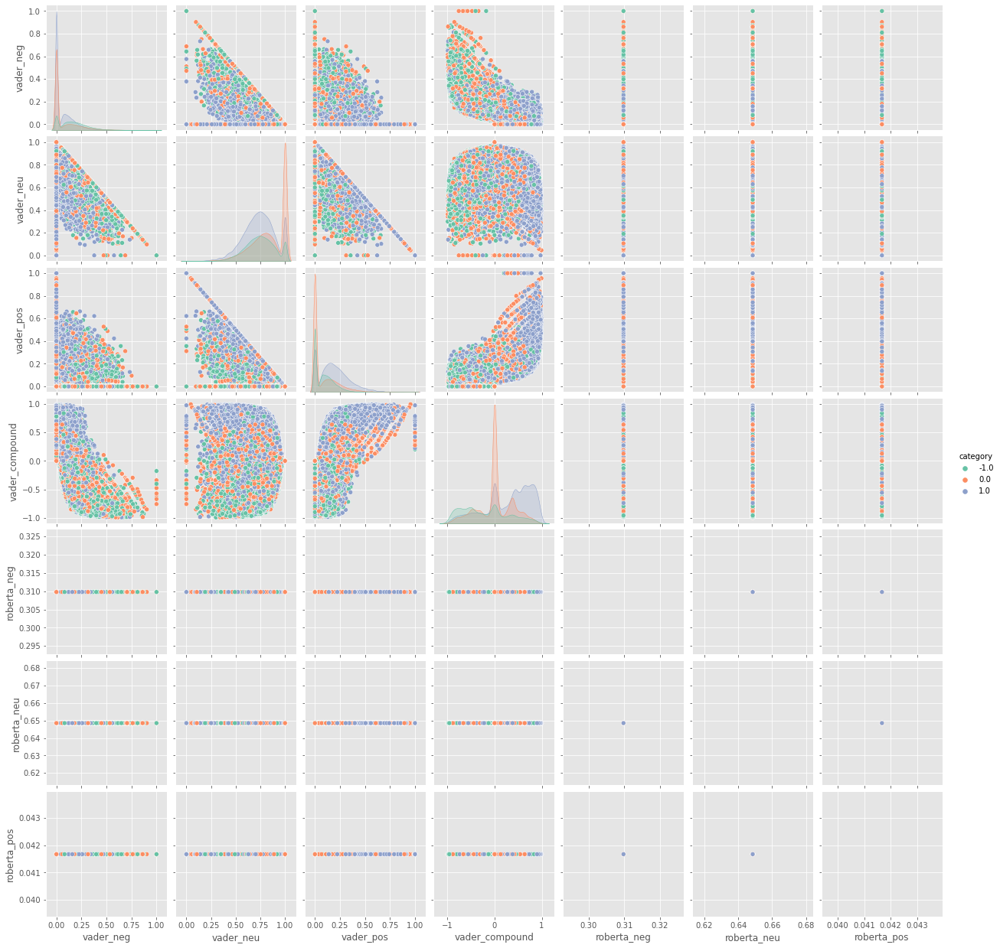

In [128]:
sns.pairplot(data = results_df,
            vars = ['vader_neg', 'vader_neu', 'vader_pos', 'vader_compound',
       'roberta_neg', 'roberta_neu', 'roberta_pos'],
             hue = 'category', palette = 'Set2')
            
plt.show()

In [129]:
print(results_df.columns)

Index(['Id', 'vader_neg', 'vader_neu', 'vader_pos', 'vader_compound',
       'roberta_neg', 'roberta_neu', 'roberta_pos', 'clean_text', 'category'],
      dtype='object')


In [130]:
results_df.query('category == 1').sort_values('roberta_pos', ascending = False)['clean_text'].values[0]

'what did just say vote for modi  welcome bjp told you rahul the main campaigner for modi think modi should just relax'

In [131]:
results_df.query('category == 1').sort_values('vader_pos', ascending = False)['clean_text'].values[0]

'excellent  '

##negative sentiment 5star review

In [132]:
results_df.query('category == -1').sort_values('roberta_neg', ascending = False)['clean_text'].values[0]

'when modi promised “minimum government maximum governance” expected him begin the difficult job reforming the state why does take years get justice state should and not business and should exit psus and temples'

In [133]:
results_df.query('category == -1').sort_values('vader_neg', ascending = False)['clean_text'].values[0]

'dead '

Transformers Pipeline ##hugging face 

In [138]:
sentiments = []
for text in twt_df['clean_text']:
    result = sent_pipeline(text)
    sentiment = result[0]['label']
    score = result[0]['score']
    sentiments.append((sentiment, score))

twt_df['sentiment'] = sentiments

In [139]:
for sentiment, score in twt_df['sentiment']:
    print(f"Sentiment: {sentiment}, Score: {score}")

Sentiment: NEGATIVE, Score: 0.9961428046226501
Sentiment: NEGATIVE, Score: 0.9936436414718628
Sentiment: NEGATIVE, Score: 0.9632663726806641
Sentiment: NEGATIVE, Score: 0.9983959794044495
Sentiment: POSITIVE, Score: 0.8206448554992676
Sentiment: POSITIVE, Score: 0.9960861206054688
Sentiment: POSITIVE, Score: 0.8447129726409912
Sentiment: NEGATIVE, Score: 0.9508271813392639
Sentiment: POSITIVE, Score: 0.9950506091117859
Sentiment: NEGATIVE, Score: 0.854236364364624
Sentiment: NEGATIVE, Score: 0.9957156777381897
Sentiment: POSITIVE, Score: 0.9328069686889648
Sentiment: POSITIVE, Score: 0.8664634823799133
Sentiment: POSITIVE, Score: 0.9857648015022278
Sentiment: POSITIVE, Score: 0.9880280494689941
Sentiment: POSITIVE, Score: 0.9774813652038574
Sentiment: NEGATIVE, Score: 0.9748501777648926
Sentiment: POSITIVE, Score: 0.9827172160148621
Sentiment: NEGATIVE, Score: 0.9763615131378174
Sentiment: NEGATIVE, Score: 0.9955126643180847
Sentiment: NEGATIVE, Score: 0.9756777286529541
Sentiment: POS